# Three complementary/equivalent formulations of Difussion models

The field of generative modelling using Deep Learning (DL) is one of the most actives and abullient areas in Machine Learning (ML) these days. Apart from the models used in the context of Natural Language Processing, which are mainly based on Transformers and Recurrent Networks, most of the theoretical and applied works focuse on one of the following four architectures/formulations:

- Variational Auto-encoders (VAEs)
- Generative Adversarial Networks (GANs)
- Normalizing Flows (NF)
- Diffusion Models (DM)

<img src="img/GM2.png" width="400">
<p style="text-align:center;">Image taken from [1]</p>


VAEs and GANs have been in the state of the art for many years, and although they are still in the core of new approaches, there is a concensus in the academic community that their development have achieved a plateau. Notwithstanding, VAEs and their many variants are still widely used alone or as part of more complex systems for image/audio generation as tools to embeb the input objects into a latent space where the generation process can be performed more efficiently and then decodify the generated embedded vector to final objects in the input space (see [Audioldm](https://audioldm.github.io/) for an example). They are also a matter of study for the very interesting and vibrant field of physics-informed Neural Networks [2] and others [3]. 

On the other hand, although NF (and Neural Network-based variants such as Autoregressive Flows) and DM have been present in the state of the art for many years, their applicability and potential for solving new theoretical and practical problems are in the core of many ongoing research.

This notebook in intended to review the Difussion Models in detail, covering basic formulations and implementations, in order to understand the basics of DM, how the multiple formulations available connect each other and opening the door to address advanced topics which will be listed at the end of the lecture.

Before starting with the basic definitions of DM, we are going to review fundamental concepts about Bayesian learning and variational inference, required to understand the mathematical formulation of DMs.

## Evidence Lower Bound

In many ML problems, we can assume that the observed data is generated by an associated unseen laten variable $z$. Therefore, the distribution of the observed variable $x$ and the laten variable could be modeled by the join distribution $p(x,z)$. There are two ways we can manipulate this joint distribution to recover the likelihood of purely observed p(x):

- Marginalize out the latent variable $z$: $p(x) = \int p(x,z)dz$
- Use the change rule of probability: $p(x) = \frac{p(x,z)}{p(z|x)}$ 

In order to maximize the likelihood $p(x)$ (the most common aim in ML training), each of the two options has its own challenges:

- The first option is difficult because it involves integrating out all latent variables z. which is intractable for complex models.
- The second option involves having access to a ground truth laten encoder $p(z|x)$, that is not available.

Combining the two former equations we can derive a proxy objective, called Evidence Lower Bound (ELBO), with which to optimize a latent variable model [4].

Let's $q_{\phi}(z|x)$ be a flexible aproximate variational distribution with parameters $\phi$ that we seek to optimize; the ELBO can be derive as follows:

$$
\begin{split}
\log p(x) & = \log \int p(x,z) dz\\
& = \log \int \frac{p(x,z)q_{\phi}(z|x)}{q_{\phi}(z|x)}\\
& = \log \mathbb{E}_{q_{\phi}(z|x)} \left[\frac{p(x,z)}{q_{\phi}(z|x)}\right]\\
& \geq \mathbb{E}_{q_{\phi}(z|x)} \left[\log \frac{p(x,z)}{q_{\phi}(z|x)}\right]
\end{split}
$$

This derivation of the ELBO does not give us a clear idea of why we want to maximize it as an objective. Let's look at an alternative derivation:

$$
\begin{split}
\log p(x) & = \log p(x) \int q_{\phi}(z|x)dz\\
& =  \int q_{\phi}(z|x)(\log p(x))dz\\
& = \mathbb{E}_{q_{\phi}(z|x)} \left[\log p(x)\right]\\
& = \mathbb{E}_{q_{\phi}(z|x)} \left[\log \frac{p(x,z)}{p(z|x)}\right]\\
& = \mathbb{E}_{q_{\phi}(z|x)} \left[\log \frac{p(x,z)}{p(z|x)}\frac{q_{\phi}(z|x)}{q_{\phi}(z|x)}\right]\\
& = \mathbb{E}_{q_{\phi}(z|x)} \left[\log \frac{p(x,z)}{q_{\phi}(z|x)}\right] + \mathbb{E}_{q_{\phi}(z|x)} \left[\log \frac{q_{\phi}(z|x)}{p(z|x)}\right]\\
& = \mathbb{E}_{q_{\phi}(z|x)} \left[\log \frac{p(x,z)}{q_{\phi}(z|x)}\right] + D_{KL}(q_{\phi}(z|x)\|p(z|x))\\
& \geq \mathbb{E}_{q_{\phi}(z|x)} \left[\log \frac{p(x,z)}{q_{\phi}(z|x)}\right]
\end{split}
$$

From this derivarion it is easy to observe that the ELBO is a lower bound for the evidence; since the KL term is not negative the ELBO can never exceed the evidence. 

In order to obtain a model that represents the latent structure of the data, the goal is then to learn the paramters of the variation posterior $q_{\phi}(z|x)$ such that it matches the true posterior distribution $p(z|x)$, which is achieved by minimizing the KL divergence term. Unfourtunately, such a minimization cannot be done directly because we do not have acces to the ground truth $p(z|x)$ distribution. However, as the left hand side of the former equation (the evidence) does not depend on $\phi$, the right hand side sum up to a constant. Therefore, any maximization of the ELBO with respect to $\phi$ necessarily invokes an equal minimization of the KL divergence term [4].

### Variational Autoencoders

As an example, we are going to use the former ELBO definition to derive the objective function used in VAEs, which is a well-known model. 


$$
\begin{split}
\mathbb{E}_{q_{\phi}({\bf{z}}|{\bf{x}})} \left[\log \frac{p({\bf{x}},{\bf{z}})}{q_{\phi}({\bf{z}}|{\bf{x}})}\right] & = \mathbb{E}_{q_{\phi}({\bf{z}}|{\bf{x}})} \left[\log \frac{p_{\theta}({\bf{x}}|{\bf{z}})p(\bf{z})}{q_{\phi}({\bf{z}}|{\bf{x}})}\right]\\
& = \mathbb{E}_{q_{\phi}({\bf{z}}|{\bf{x}})} \left[\log p_{\theta}({\bf{x}}|{\bf{z}})\right] + \mathbb{E}_{q_{\phi}({\bf{z}}|{\bf{x}})} \left[\log \frac{p({\bf{z}})}{q_{\phi}({\bf{z}}|{\bf{x}})}\right]\\
& = \mathbb{E}_{q_{\phi}({\bf{z}}|{\bf{x}})} \left[\log p_{\theta}({\bf{x}}|{\bf{z}})\right] - D_{KL}(q_{\phi}({\bf{z}}|{\bf{x}})\|p({\bf{z}}))
\end{split}
$$

The first term is then the reconstruction error and the second term is the KL divergence between the variational distribution and the prior distribution that is tipically assumed as $\mathcal{N}({\bf{0}},{\bf{I}})$. During training, the model simultanously learns the intermediate bottlenecking distribution $q_{\phi}({\bf{z}}|{\bf{x}})$ that can be treated as an encoder, and the parameters $\theta$ of the deterministic function $p_{\theta}({\bf{x}}|{\bf{z}})$ that converts a given latent vector $\bf{z}$ into an observation $\bf{x}$ (called Decoder).

## Denoising Difussion Probabilistic Models (DDPM)

<img src="img/DDPM.png" width="600">
<p style="text-align:center;">Image taken from [5]</p>

A diffusion probabilistic model is composed of two Markov chain:

- A forward (noising) process, which is a Markov chain that gradually adds noise to the data until the signal is destroyed.
- A reverse (denoising) process, which is a parameterized Markov chain whise transitions are learned to reverse the diffusion process.

A DDPM is a simplified Hierarchical Variational Autoencoder (or Recursive VAE) [4], where the dimension of the latent dimension is exactly equal to the data dimension, the structure of the latent encoder is not learned and the Gaussian parameters of the latent encoders vary over time.

Let's ${\bf{x}}_t$ a latent variable, where $t=0$ represents true data samples and $t\in[1,T]$ represents a corresponding latent with hierarchy indexed by $t$. By considering the Markov condition, the posterior distribution of the forward process can be written as:

$$
q({\bf{x}}_{1:T}|{\bf{x}}_0) = \prod_{t=1}^T q({\bf{x}}_t|{\bf{x}}_{t-1})
$$

As pointed out before, the structure of the latent encoder at each timestep $t$ is no learned, but it is fixed as a linear Gaussian model, where the mean and standard deviation are typically set to predefined values that change deterministically over time (they can also be treated as parameters and learned during training [6]). Thus, the Gaussian encoder is defined to preserve the variance during the forward process:

$$
q({\bf{x}}_t|{\bf{x}}_{t-1}) = \mathcal{N}({\bf{x}}_{T};\sqrt{\alpha_t}{\bf{x}}_{t-1},(1-\alpha_t){\bf{I}})
$$

The joint distribution of the DDPM is given by:

$$
p({\bf{x}}_{0:T}) = p({\bf{x}}_T)\prod_{t=1}^T p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})
$$

Under the assumption that the evolution of $\alpha_t$ over time produces a final latent distribution $p({\bf{x}}_T)$ equal to a standard Gaussian $\mathcal{N}({\bf{x}}_T;{\bf{0}},{\bf{I}})$.

A notable property of the forward process is that it admits sampling ${\bf{x}}_{t}$ at an arbitrary timestep $t$ in closed form. Let's see how.

Using the reparameterization trick is easy to see that sampling ${\bf{x}}_t \sim q({\bf{x}}_t|{\bf{x}}_{t-1})$ is equivalent to:

$${\bf{x}}_t = \sqrt{\alpha_t}{\bf{x}}_{t-1} + \sqrt{1-\alpha_t}\mathbf{\epsilon}_{t-1}; \;\; \mathbf{\epsilon}_{t-1} \sim \mathcal{N}({\bf{0}},{\bf{I}})$$ 

Now, we would like to get ${\bf{x}}_t$ samples without having to estimate ${\bf{x}}_{t-1}$ but using directly the true sample ${\bf{x}}_0$. Therefore,

$$
\begin{split}
{\bf{x}}_t & = \sqrt{\alpha_t}{\bf{x}}_{t-1} + \sqrt{1-\alpha_t}{\mathbf{\epsilon}}_{t-1}\\
           & = \sqrt{\alpha_t}\left( \sqrt{\alpha_{t-1}}{\bf{x}}_{t-2} + \sqrt{1-\alpha_{t-1}}\mathbf{\epsilon}_{t-2} \right) + \sqrt{1-\alpha_t}\mathbf{\epsilon}_{t-1}\\
           & = \sqrt{\alpha_t\alpha_{t-1}}{\bf{x}}_{t-2} + \underbrace{\sqrt{\alpha_t-\alpha_t\alpha_{t-1}}\epsilon_{t-2} + \sqrt{1-\alpha_t}\mathbf{\epsilon}_{t-1}}_{\text{Equivalent to the sum of two Gaussians with mean = $\bf{0}$ and different variance}}\\
           & = \sqrt{\alpha_t\alpha_{t-1}}{\bf{x}}_{t-2} + \sqrt{\sqrt{\alpha_t-\alpha_t\alpha_{t-1}}^2 + \sqrt{1-\alpha_t}^2}\epsilon_{t-2}\\
           & =\sqrt{\alpha_t\alpha_{t-1}}{\bf{x}}_{t-2} + \sqrt{1-\alpha_t\alpha_t-1}\mathbf{\epsilon}_{t-2}\\
           & = \cdots\\
           & = \sqrt{\prod_{i=1}^t \alpha_i} {\bf{x}}_{0} + \sqrt{1 - \prod_{i=1}^t \alpha_i}\mathbf{\epsilon}_{0}\\
           & = \sqrt{\bar{\alpha}_t}{\bf{x}}_{0} + \sqrt{1 -\bar{\alpha}_t}\mathbf{\epsilon}_{0}\\
           &\sim \mathcal{N}({\bf{x}}_{t};\sqrt{\bar{\alpha}_t}{\bf{x}}_{0},(1 -\bar{\alpha}_t){\bf{I}})
\end{split}
$$

Now, let's try to apply the ELBO to DDPMs in order to find a loss function to optimize [4]:

$$
\begin{split}
\log p({\bf{x}}_{0:T}) & = \log \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\frac{p({\bf{x}}_{0:T})}{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\right]\\
& \geq \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_{0:T})}{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\right]\\
& = \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)\prod_{t=1}^T p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{\prod_{t=1}^T q({\bf{x}}_t|{\bf{x}}_{t-1})}\right]\\
& = \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\prod_{t=2}^{T} p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_T|{\bf{x}}_{T-1})\prod_{t=1}^{T-1} q({\bf{x}}_t|{\bf{x}}_{t-1})}\right]\\
& = \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\prod_{t=1}^{T-1} p_{\theta}({\bf{x}}_{t}|{\bf{x}}_{t+1})}{q({\bf{x}}_T|{\bf{x}}_{T-1})\prod_{t=1}^{T-1} q({\bf{x}}_t|{\bf{x}}_{t-1})}\right]\\
&=\mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)}{q({\bf{x}}_T|{\bf{x}}_{T-1})}\right] + \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \prod_{t=1}^{T-1} \frac{p_{\theta}({\bf{x}}_{t}|{\bf{x}}_{t+1})}{q({\bf{x}}_t|{\bf{x}}_{t-1})}\right]\\
&= \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\right] + \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_{T})}{q({\bf{x}}_T|{\bf{x}}_{T-1})}\right] + \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[ \sum_{t=1}^{T-1} \log \frac{p_{\theta}({\bf{x}}_{t}|{\bf{x}}_{t+1})}{q({\bf{x}}_t|{\bf{x}}_{t-1})} \right]\\
&=\mathbb{E}_{q({\bf{x}}_{1}|{\bf{x}}_0)}\left[\log p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\right] + \mathbb{E}_{q({\bf{x}}_{T-1},{\bf{x}}_{T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_{T})}{q({\bf{x}}_T|{\bf{x}}_{T-1})}\right] + \sum_{t=1}^{T-1} \mathbb{E}_{q({\bf{x}}_{t-1},{\bf{x}}_{t},{\bf{x}}_{t+1}|{\bf{x}}_0)}\left[\log \frac{p_{\theta}({\bf{x}}_{t}|{\bf{x}}_{t+1})}{q({\bf{x}}_t|{\bf{x}}_{t-1})} \right]\\
& = \underbrace{\mathbb{E}_{q({\bf{x}}_{1}|{\bf{x}}_0)}\left[\log p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\right]}_{\text{reconstruction term}} - \underbrace{\mathbb{E}_{q({\bf{x}}_{T-1}|{\bf{x}}_0)}\left[D_{KL}(q({\bf{x}}_{T}|{\bf{x}}_{T-1})\|p({\bf{x}}_{T}))\right]}_{\text{prior matching term}} - \sum_{t=1}^{T-1} \underbrace{\mathbb{E}_{q({\bf{x}}_{t-1},{\bf{x}}_{t+1}|{\bf{x}}_0)}\left[D_{KL}(q({\bf{x}}_t|{\bf{x}}_{t-1})\|p_{\theta}({\bf{x}}_{t}|{\bf{x}}_{t+1}))\right]}_{\text{consistency term}}
\end{split}
$$

The terms that constitute the former ELBO can be interpreted as [4]:

- The *reconstruction term* predicts the log probability of the original data sample given the first-step latent. This is equivalent to the reconstruction term in the VAE formulation.

- The *prior matching term* is also similar to that of the VAE and is minimized when the the final latent distribution is Gaussian. But, unlike VAE, this term requires no optimization, as it has no trainable paramters.

- The *consistency term* atttempts to make the distribution at ${\bf{x}}_{t}$ consistent, from both forward and backward processes. "That is, a denoising step from a noisier image should match the corresponding noising step from a cleaner image, for every intermediate timestep; this is reflected mathematically by the KL Divergence". 

$$\require{cancel}$$  

The consistency term in the former formulation, although interpretable, is hard to compute since it requires computing expectation over two random variables $\{{\bf{x}}_{t-1},{\bf{x}}_{t+1}\}$ for every time step. Moreover, the variance of the ELBO may be large, as it is computed by summing up $T-1$ terms. However, there is an alternative formulation that uses a mathematical trick based on the Markov property of the process. The key insight is that the encoder transitions $q({\bf{x}}_{t}|{\bf{x}}_{t-1}) = q({\bf{x}}_{t}|{\bf{x}}_{t-1}, {\bf{x}}_{0})$, where the extra conditioning variable is redundant due to the Markov property. 

According to the Bayes rule:
$$
q({\bf{x}}_{t}|{\bf{x}}_{t-1}, {\bf{x}}_{0}) = \frac{q({\bf{x}}_{t-1}|{\bf{x}}_{t}, {\bf{x}}_{0})q({\bf{x}}_{t}|{\bf{x}}_{0})}{q({\bf{x}}_{t-1}|{\bf{x}}_{0})}
$$

Now, let's derive the ELBO again [4]:

$$
\begin{split}
\log p({\bf{x}}_{0:T}) & \geq \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_{0:T})}{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\right]\\
& = \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)\prod_{t=1}^T p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{\prod_{t=1}^T q({\bf{x}}_t|{\bf{x}}_{t-1})}\right]\\
& = \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\prod_{t=2}^{T} p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_1|{\bf{x}}_{0})\prod_{t=2}^{T} q({\bf{x}}_t|{\bf{x}}_{t-1})}\right]\\
& = \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\prod_{t=2}^{T} p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_1|{\bf{x}}_{0})\prod_{t=2}^{T} q({\bf{x}}_t|{\bf{x}}_{t-1}, {\bf{x}}_{0})}\right]\\
& = \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)}{q({\bf{x}}_1|{\bf{x}}_{0})} + \log \prod_{t=2}^T \frac{p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_t|{\bf{x}}_{t-1}, {\bf{x}}_{0})}\right]\\
& = \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)}{q({\bf{x}}_1|{\bf{x}}_{0})} + \log \prod_{t=2}^T \frac{p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{\frac{q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})q({\bf{x}}_{t}|{\bf{x}}_{0})}{q({\bf{x}}_{t-1}|{\bf{x}}_{0})}}\right]\\
&= \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)}{q({\bf{x}}_1|{\bf{x}}_{0})} + \log \prod_{t=2}^T \frac{q({\bf{x}}_{t-1}|{\bf{x}}_{0})}{q({\bf{x}}_{t}|{\bf{x}}_{0})} + \log \prod_{t=2}^T \frac{p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})} \right]\\
&= \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)}{q({\bf{x}}_1|{\bf{x}}_{0})} + \underbrace{\sum_{t=2}^T \log  \frac{q({\bf{x}}_{t-1}|{\bf{x}}_{0})}{q({\bf{x}}_{t}|{\bf{x}}_{0})}}_{\text{telescopic summation}} + \sum_{t=2}^T \log  \frac{p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})} \right]\\
&= \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)}{\cancel{q({\bf{x}}_1|{\bf{x}}_{0})}} + \log \frac{\cancel{q({\bf{x}}_{1}|{\bf{x}}_0)}}{q({\bf{x}}_{T}|{\bf{x}}_0)} + \sum_{t=2}^T \log  \frac{p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})} \right]\\
&= \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_T)p_{\theta}({\bf{x}}_0|{\bf{x}}_1)}{q({\bf{x}}_T|{\bf{x}}_{0})} + \sum_{t=2}^T \log  \frac{p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})} \right]\\
&= \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\right] + \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_{T})}{q({\bf{x}}_T|{\bf{x}}_{0})}\right] + \sum_{t=2}^T \mathbb{E}_{q({\bf{x}}_{1:T}|{\bf{x}}_0)}\left[\log  \frac{p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})} \right]\\
&= \mathbb{E}_{q({\bf{x}}_{1}|{\bf{x}}_0)}\left[\log p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\right] + \mathbb{E}_{q({\bf{x}}_{T}|{\bf{x}}_0)}\left[\log \frac{p({\bf{x}}_{T})}{q({\bf{x}}_T|{\bf{x}}_{0})}\right] + \sum_{t=2}^T \mathbb{E}_{q({\bf{x}}_{t},{\bf{x}}_{t-1}|{\bf{x}}_0)}\left[\log  \frac{p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})}{q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})} \right]\\
& = \underbrace{\mathbb{E}_{q({\bf{x}}_{1}|{\bf{x}}_0)}\left[\log p_{\theta}({\bf{x}}_0|{\bf{x}}_1)\right]}_{\text{reconstruction term}} - \underbrace{D_{KL}(q({\bf{x}}_{T}|{\bf{x}}_{0})\|p({\bf{x}}_{T}))}_{\text{prior matching term}} - \sum_{t=2}^{T} \underbrace{\mathbb{E}_{q({\bf{x}}_{t}|{\bf{x}}_0)}\left[D_{KL}(q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})\|p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t}))\right]}_{\text{denoising matching term}}
\end{split}
$$

This terms can also be interpretes as before [4]:

- The *reconstruction term* is exactly the same as before. By considering that the last term sums up $T-1$ terms, this term can be neglected. 

- The *prior matching term* represents how close the distribution of the final noisified input is to the standard Gaussian prior. It has no trainable parameters, and is also equal to zero under our assumptions.

- The *denoising matching term* uses $q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})$ as a ground truth to learn $p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t})$. The ground truth "defines how to denoise a noisy sample ${\bf{x}}_{t}$  with access to what the final, completely denoised sample ${\bf{x}}_{0}$ should be" [4].

Now, let's dig deeper inside the denoising matching term. Remeber that $q({\bf{x}}_{t}|{\bf{x}}_{0}) = \mathcal{N}({\bf{x}}_{t};\sqrt{\bar{\alpha}_t}{\bf{x}}_{0},(1 -\bar{\alpha}_t){\bf{I}})$, so using the Bayes rule

$$
\begin{split}
q({\bf{x}}_{t-1}|{\bf{x}}_{t}, {\bf{x}}_{0}) &= \frac{q({\bf{x}}_{t}|{\bf{x}}_{t-1}, {\bf{x}}_{0})q({\bf{x}}_{t-1}|{\bf{x}}_{0})}{q({\bf{x}}_{t}|{\bf{x}}_{0})}\\
&= \frac{\mathcal{N}({\bf{x}}_{t};\sqrt{\alpha_t}{\bf{x}}_{t-1},(1 -\alpha_t){\bf{I}})\mathcal{N}({\bf{x}}_{t-1};\sqrt{\bar{\alpha}_{t-1}}{\bf{x}}_{0},(1 -\bar{\alpha}_{t-1}){\bf{I}})}{\mathcal{N}({\bf{x}}_{t};\sqrt{\bar{\alpha}_t}{\bf{x}}_{0},(1 -\bar{\alpha}_t){\bf{I}})}\\
&=... \\
&\propto \mathcal{N}({\bf{x}}_{t-1}; \tilde{\mathbf{\mu}}_t({\bf{x}}_{t},{\bf{x}}_{0}),\tilde{\mathbf{\Sigma}}_t)
\end{split}
$$
where [4],
$$
\tilde{\mathbf{\mu}}_t({\bf{x}}_{t},{\bf{x}}_{0}) = \frac{\sqrt{\alpha_t}(1 - \bar{\alpha}_{t-1}){\bf{x}}_t + \sqrt{\bar{\alpha}_{t-1}}(1-\bar{\alpha}_{t}){\bf{x}}_0}{1-\bar{\alpha}_t}
$$
$$
\tilde{\mathbf{\Sigma}}_t = \frac{(1-\alpha_t)(1-\bar{\alpha}_{t-1})}{1-\bar{\alpha}_t}{\bf{I}} = \tilde{\sigma}_t^2{\bf{I}}
$$

**Reversibility of Gaussian Distributions**: One of the essential properties of Gaussian distributions is that they are closed under linear transformations and convolution with other Gaussians. Since the forward process involves adding Gaussian noise (which is a convolution operation), the reverse process essentially "removes" that noise. Because Gaussians are closed under these operations, the reverse process remains Gaussian (see [Wikipedia](https://en.wikipedia.org/wiki/Sum_of_normally_distributed_random_variables) for a proof.).

Therefore, we can assume that $p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t}) = \mathcal{N}(\mu_{\theta}({\bf{x}}_{t},t),\sigma_{\theta}^2{\bf{I}})$. Furthermore, as all $\alpha$ terms are known to be frozen at each timestep we can immediately construct the variance of the approximate denoising transition step to also be $\sigma_{\theta}^2{\bf{I}} = \tilde{\sigma}_t^2{\bf{I}} = \Sigma_t$.

The KL divergence between two multivariate Gaussian distributions is given by:

$$
D_{KL}\left(\mathcal{N}({\bf{x}};\mu_{\bf{x}},\Sigma_{\bf{x}})\|\mathcal{N}({\bf{y}};\mu_{\bf{y}},\Sigma_{\bf{y}}) \right) = \frac{1}{2}\left[ \log \frac{|\Sigma_{\bf{y}}|}{|\Sigma_{\bf{x}}|} - d + \text{tr}\left( \Sigma_{\bf{y}}^{-1}\Sigma_{\bf{x}}\right) + (\mu_{\bf{y}} - \mu_{\bf{x}})^\top \Sigma_{\bf{y}}^{-1} (\mu_{\bf{y}} - \mu_{\bf{x}})\right]
$$

So,

$$
\begin{split}
&\underset{\theta}{\arg\min} D_{KL}(q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})\|p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t}))\\
= & \underset{\theta}{\arg\min} D_{KL}(\mathcal{N}({\bf{x}}_{t-1};\tilde{\mathbf{\mu}}_t({\bf{x}}_{t},{\bf{x}}_{0}),\Sigma_{t})\|\mathcal{N}({\bf{x}}_{t-1};\mu_{\theta}({\bf{x}}_{t},t),\Sigma_{t})\\
= & ...\\
= & \underset{\theta}{\arg\min} \frac{1}{2\tilde{\sigma}_t^2} \left[ \|\mu_{\theta}({\bf{x}}_{t},t) - \tilde{\mathbf{\mu}}_t({\bf{x}}_{t},{\bf{x}}_{0})\|_2^2\right]
\end{split}
$$

We can simplify the former expression even more. Considering that $\mu_{\theta}({\bf{x}}_{t},t)$ conditions on ${\bf{x}}_{t}$, as $\tilde{\mathbf{\mu}}_t({\bf{x}}_{t},{\bf{x}}_{0})$ does; we can set $\mu_{\theta}({\bf{x}}_{t},t)$ to closely math the definition of $\tilde{\mathbf{\mu}}_t({\bf{x}}_{t},{\bf{x}}_{0})$ using the following form:

$$
\mu_{\theta}({\bf{x}}_{t},t) = \frac{\sqrt{\alpha_t}(1 - \bar{\alpha}_{t-1}){\bf{x}}_t + \sqrt{\bar{\alpha}_{t-1}}(1-\bar{\alpha}_{t}){\hat{\bf{x}}}_{\theta}({\bf{x}}_{t},t)}{1-\bar{\alpha}_t}
$$

So now,
$$
\begin{split}
&\underset{\theta}{\arg\min} D_{KL}(q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})\|p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t}))\\
= & \underset{\theta}{\arg\min} \frac{1}{2\tilde{\sigma}_t^2} \frac{\bar{\alpha}_{t-1}(1 - \alpha_t)^2}{(1 - \bar{\alpha}_{t})^2}\left[\| {\hat{\bf{x}}}_{\theta}({\bf{x}}_{t},t) - {\bf{x}}_{0}\|_2^2\right]
\end{split}
$$

where ${\hat{\bf{x}}}_{\theta}({\bf{x}}_{t},t)$ is a function approximator (i.e. an artificial neural network).

**Equivalently**, recall that ${\bf{x}}_{t} = \sqrt{\bar{\alpha}_t}{\bf{x}}_{0} + \sqrt{1 -\bar{\alpha}_t}\mathbf{\epsilon}$. Thus, solving for ${\bf{x}}_{0}$:
$$
{\bf{x}}_{0} = \frac{1}{\sqrt{\bar{\alpha}}_t}({\bf{x}}_{t} - \sqrt{1 - \bar{\alpha}_t}\epsilon)
$$
Plugin the former equation in:
$$
\begin{split}
\tilde{\mathbf{\mu}}_t({\bf{x}}_{t},{\bf{x}}_{0}) & = \frac{\sqrt{\alpha_t}(1 - \bar{\alpha}_{t-1}){\bf{x}}_t + \sqrt{\bar{\alpha}_{t-1}}(1-\bar{\alpha}_{t}){\bf{x}}_0}{1-\bar{\alpha}_t}\\
& = \frac{1}{\sqrt{\alpha_t}}\left({\bf{x}}_{t} - \frac{1- \alpha_t}{\sqrt{1-\bar{\alpha}_t}}\epsilon \right)
\end{split}
$$

Thefore, similar to the previous analysis, we could assume that $\mu_{\theta}({\bf{x}}_{t},t)$ takes the form:

$$
\mu_{\theta}({\bf{x}}_{t},t) =  \frac{1}{\sqrt{\alpha_t}}\left({\bf{x}}_{t} - \frac{1- \alpha_t}{\sqrt{1-\bar{\alpha}_t}}\epsilon_{\theta}({\bf{x}}_{t},t) \right)
$$

and instead of predicting ${\bf{x}}_{0}$ from a noisy version corrupted by $t$ steps of the forward process, we try to predict the noise. The loss function can then be written as:

$$
\begin{split}
&\underset{\theta}{\arg\min} D_{KL}(q({\bf{x}}_{t-1}|{\bf{x}}_{t},{\bf{x}}_{0})\|p_{\theta}({\bf{x}}_{t-1}|{\bf{x}}_{t}))\\
= & \underset{\theta}{\arg\min} \frac{1}{2\tilde{\sigma}_t^2} \frac{(1 - \alpha_t)^2}{(1 - \bar{\alpha}_{t})\alpha_t}\left[\| \epsilon - \epsilon_{\theta}(\sqrt{\bar{\alpha}_t}{\bf{x}}_{0} + \sqrt{1 -\bar{\alpha}_t}\mathbf{\epsilon},t)\|_2^2\right]
\end{split}
$$

According to [5], neglecting the weighting term produces better results.

## Basic implementation of a DDPM

As dataset we use the StandordCars Dataset, which consists of around 8000 images in the train set. Let's see if this is enough to get good results ;-)

In [3]:
#!pip install opendatasets --upgrade --quiet

import opendatasets as od

dataset_url = 'https://www.kaggle.com/jutrera/stanford-car-dataset-by-classes-folder'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: jdariasl
Your Kaggle Key: ········
Dataset URL: https://www.kaggle.com/datasets/jutrera/stanford-car-dataset-by-classes-folder


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.83G/1.83G [02:48<00:00, 11.7MB/s]


In [1]:
import os
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor
import torch.nn.functional as F
from torch import nn
from torch.optim import Adam
import math

In [2]:
DATA_DIR_TRAIN = './stanford-car-dataset-by-classes-folder/car_data/car_data/train'
train_classes = os.listdir(DATA_DIR_TRAIN)

DATA_DIR_TEST = './stanford-car-dataset-by-classes-folder/car_data/car_data/test'
test_classes = os.listdir(DATA_DIR_TEST)

In [3]:
train_classes[:5], test_classes[:5]

(['Ford Expedition EL SUV 2009',
  'BMW M5 Sedan 2010',
  'Chevrolet Silverado 1500 Classic Extended Cab 2007',
  'MINI Cooper Roadster Convertible 2012',
  'Aston Martin V8 Vantage Convertible 2012'],
 ['Ford Expedition EL SUV 2009',
  'BMW M5 Sedan 2010',
  'Chevrolet Silverado 1500 Classic Extended Cab 2007',
  'MINI Cooper Roadster Convertible 2012',
  'Aston Martin V8 Vantage Convertible 2012'])

In [4]:
train_dataset = ImageFolder(DATA_DIR_TRAIN, transform = ToTensor())

In [5]:
Ns = len(train_dataset)

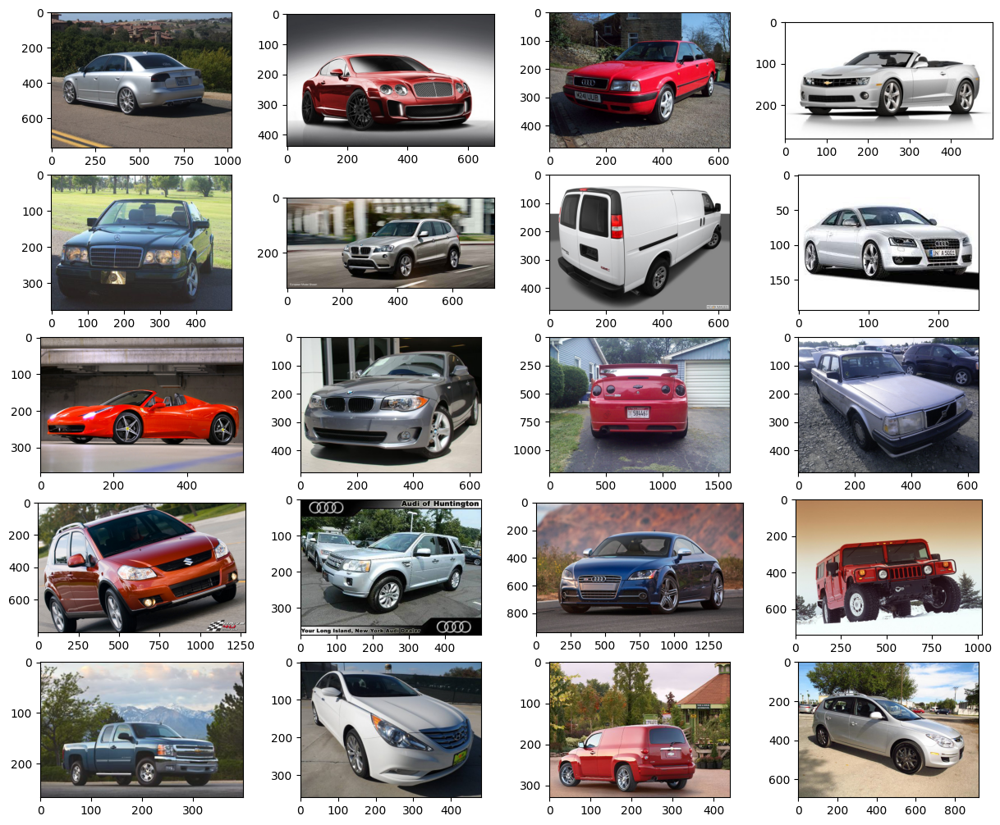

In [6]:
def show_images(datset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15))
    #for i, img in enumerate(train_dataset):
    for i in range(Ns):
        if i == num_samples:
            break
        indx = np.random.permutation(Ns)
        img, _ = train_dataset[i+indx[0]]
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(np.moveaxis(img.numpy(),0,-1))
show_images(train_dataset)

### Step 1: The forward process = Noise scheduler

We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided before to calculate the image for any of the timesteps individually.

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [7]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

Let's test it on our dataset ...

In [8]:
IMG_SIZE = 128
BATCH_SIZE = 128

data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
data_transform = transforms.Compose(data_transforms)

train_dataset = ImageFolder(DATA_DIR_TRAIN, transform = data_transform)
test_dataset = ImageFolder(DATA_DIR_TEST, transform = data_transform)

data = torch.utils.data.ConcatDataset([train_dataset, test_dataset])

dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

Simulate forward diffusion...

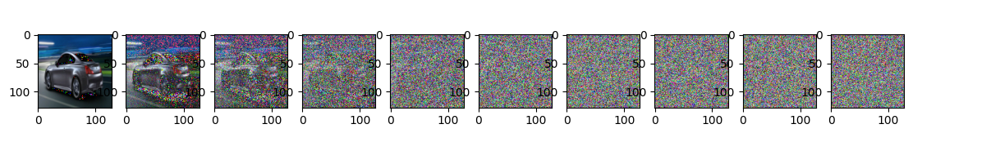

In [9]:
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))
    
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,2))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

### Step 2: The backward process = U-Net

For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.

**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed

In [10]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

### Step 3: The loss

In [11]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    #return F.l1_loss(noise, noise_pred)
    return F.mse_loss(noise, noise_pred)

### Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [16]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,2))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

### Training

In [15]:
#model = torch.load('Diff_U_net.pt',weights_only=False)

Epoch 0 | step 000 Loss: 0.03325815871357918 


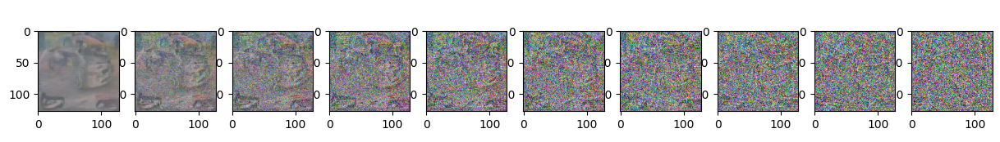

Epoch 5 | step 000 Loss: 0.03524022921919823 


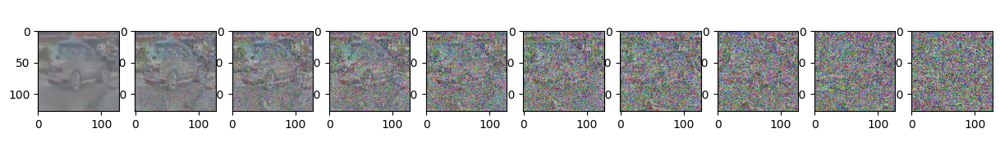

Epoch 10 | step 000 Loss: 0.03422411531209946 


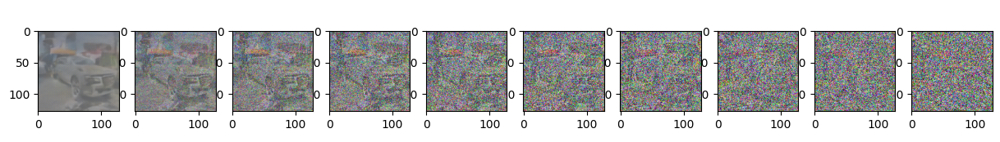

Epoch 15 | step 000 Loss: 0.031383004039525986 


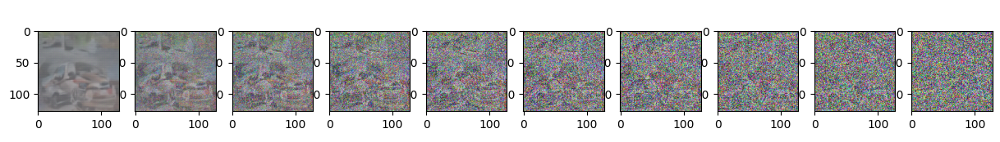

Epoch 20 | step 000 Loss: 0.03868326544761658 


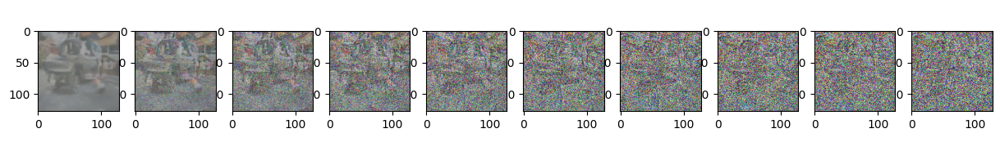

Epoch 25 | step 000 Loss: 0.03316314518451691 


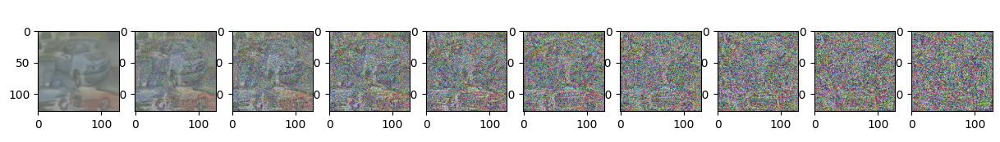

Epoch 30 | step 000 Loss: 0.03726218268275261 


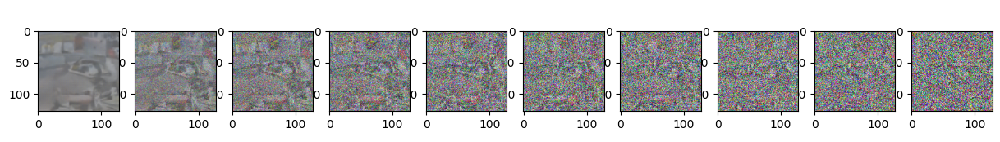

Epoch 35 | step 000 Loss: 0.030211929231882095 


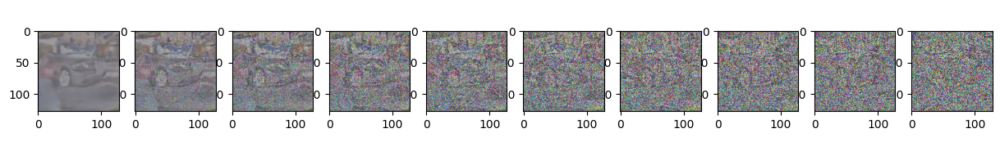

Epoch 40 | step 000 Loss: 0.03822268173098564 


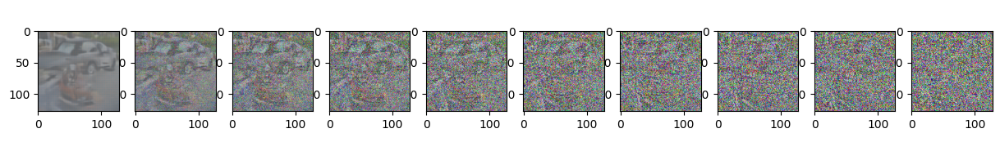

Epoch 45 | step 000 Loss: 0.04215489327907562 


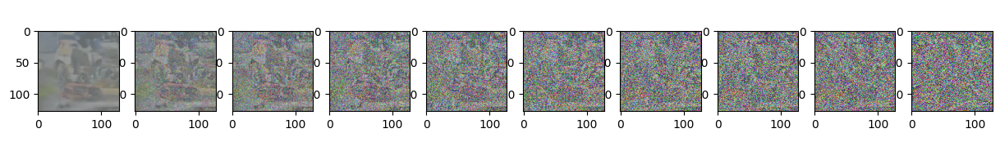

Epoch 50 | step 000 Loss: 0.032180219888687134 


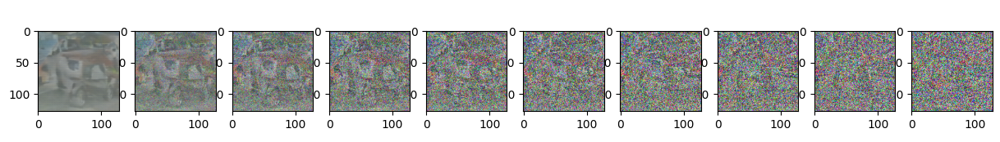

Epoch 55 | step 000 Loss: 0.029676010832190514 


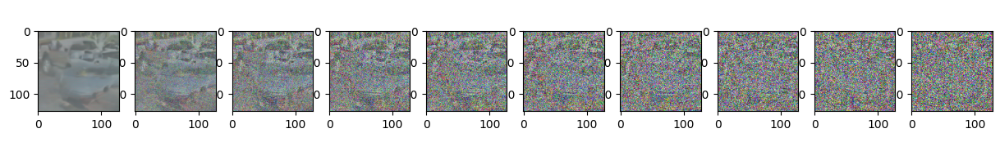

Epoch 60 | step 000 Loss: 0.02756999433040619 


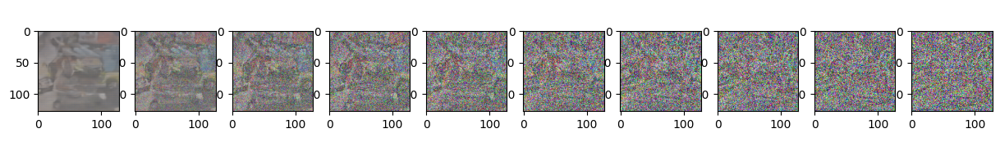

Epoch 65 | step 000 Loss: 0.038445040583610535 


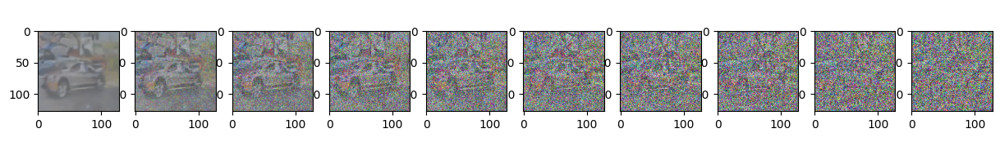

Epoch 70 | step 000 Loss: 0.03240296244621277 


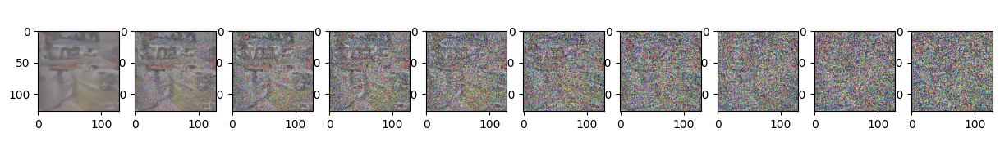

Epoch 75 | step 000 Loss: 0.029041364789009094 


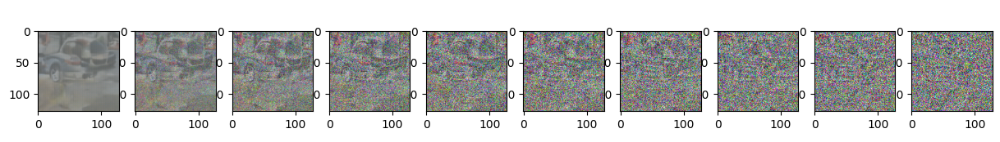

Epoch 80 | step 000 Loss: 0.03267955780029297 


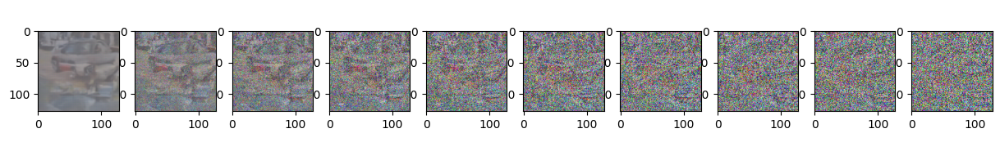

Epoch 85 | step 000 Loss: 0.037529271095991135 


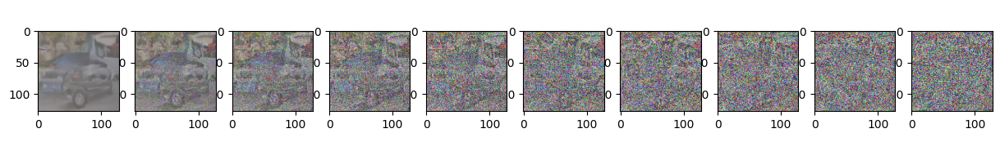

Epoch 90 | step 000 Loss: 0.022238608449697495 


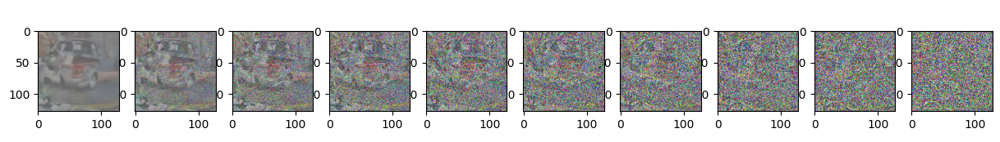

Epoch 95 | step 000 Loss: 0.030617307871580124 


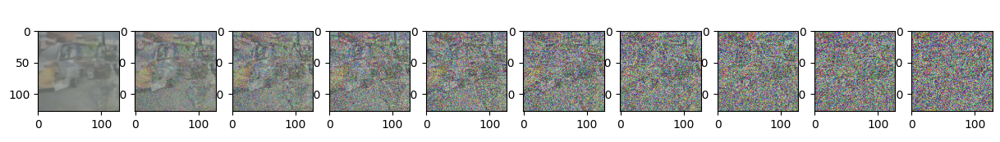

In [17]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100 # Try more!

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
            sample_plot_image()

In [18]:
torch.save(model, 'Diff_U_net.pt')

## Score-based Generative Models

The score (stein) function is defined as:

$$
{\bf{s}}_{\theta}({\bf{x}}) = \nabla_{\bf{x}} \log p_{\theta}({\bf{x}})
$$

<img src="img/Stein.png" width="800">

$$\require{cancel}$$ 

There are two reason why optimizing a score function makes sense. 

- First, let's assume you are estimating a pdf using a ANN, the output of the network function $f_{\theta}({\bf{x}})$, which can be also understood as an energy function, so the probability distribution can be written as:

$$
p_{\theta}({\bf{x}}) = \frac{\exp(f_{\theta}({\bf{x}}))}{Z_{\theta}}
$$

where $Z_{\theta}$ is a normalizing constant to ensure that $\int p_{\theta}({\bf{x}}) d{\bf{x}} = 1$. When applying Maximum likehood it is required to have acces to a tractably computable normalizing constant, which may not be possible for complex $f_{\theta}(\cdot)$. However, by estimating the score function:

$$
\begin{split}
\nabla_{\bf{x}} \log p_{\theta}({\bf{x}}) & = \nabla_{\bf{x}} \log \left( \frac{\exp(f_{\theta}({\bf{x}}))}{Z_{\theta}} \right)\\
&= \nabla_{\bf{x}} f_{\theta}({\bf{x}}) - \cancel{\nabla_{\bf{x}} \log Z_{\theta}}\\
&= \nabla_{\bf{x}} f_{\theta}({\bf{x}})\\
&= {\bf{s}}_{\theta}({\bf{x}})
\end{split}
$$

Which can be freely represented by an ANN without involving any normalization constant.

- Second, thanks to Langevin dynamics, we can sample from a distribution using only its score function by applying

$$
{\bf{x}}_{t+1} \leftarrow {\bf{x}}_{t} + \frac{\eta}{2}{\bf{s}}_{\theta}({\bf{x}}_t)
$$

or to avoid the method to collpase we can apply Annealing Langevin dynamics:

$$
{\bf{x}}_{t+1} \leftarrow {\bf{x}}_{t} + \frac{\eta}{2}{\bf{s}}_{\theta}({\bf{x}}_t) + \sqrt{\eta}\epsilon
$$

where $\epsilon \sim \mathcal{N}({\bf{0}},{\bf{I}})$.

The score model can be optimized by minimizing the Fisher Divergence with the ground truth score function:

$$
\mathbb{E}_{p({\bf{x}})} \left[ \|\underbrace{\nabla_{\bf{x}} \log p_{\theta}({\bf{x}})}_{\text{unknown}} - {\bf{s}}_{\theta}({\bf{x}})\|\right]
$$

Fourtunately, there is a technique call Score Matching [7] that only requires to have acces the score function. The following expression is equivalent to the Fisher divergence formulation:

$$
\mathbb{E}_{p({\bf{x}})} \left[ \frac{1}{2} \|{\bf{s}}_{\theta}({\bf{x}})\|_2^2 + \underbrace{\text{tr}\left( \underbrace{\nabla_{\bf{x}} {\bf{s}}_{\theta}}_{\text{Jacobian of} {\,\bf{s}}_{\theta}}\right)}_{\text{div}({\bf{s}}_{\theta})} \right]
$$

The problem that arise is that $\nabla_{\bf{x}} {\bf{s}}_{\theta}$ is hard to compute for images, videos and high dimensional data in general. 

There are two main approaches:

- Sliced score matching

- Denoising score matching

### References

[1] Yang, Y., Jin, M., Wen, H., Zhang, C., Liang, Y., Ma, L., ... & Wen, Q. (2024). A survey on diffusion models for time series and spatio-temporal data. arXiv preprint arXiv:2404.18886.

[2] Brunton, S. L., & Kutz, J. N. (2022). Data-driven science and engineering: Machine learning, dynamical systems, and control. Cambridge University Press.

[3] Chen, N., Klushyn, A., Ferroni, F., Bayer, J., & Van Der Smagt, P. (2020). [Learning flat latent manifolds with vaes](https://arxiv.org/abs/2002.04881). arXiv preprint arXiv:2002.04881.

[4] Luo, C. (2022). [Understanding diffusion models: A unified perspective](https://arxiv.org/abs/2208.11970). arXiv preprint arXiv:2208.11970.

[5] Ho, J., Jain, A., & Abbeel, P. (2020). [Denoising diffusion probabilistic models](https://proceedings.neurips.cc/paper/2020/file/4c5bcfec8584af0d967f1ab10179ca4b-Paper.pdf). Advances in neural information processing systems, 33, 6840-6851.

[6] Kingma, D., Salimans, T., Poole, B., & Ho, J. (2021). [Variational diffusion models](https://proceedings.neurips.cc/paper/2021/hash/b578f2a52a0229873fefc2a4b06377fa-Abstract.html). Advances in neural information processing systems, 34, 21696-21707.

[7] Hyvärinen, A., & Dayan, P. (2005). [Estimation of non-normalized statistical models by score matching](https://www.jmlr.org/papers/volume6/hyvarinen05a/hyvarinen05a.pdf). Journal of Machine Learning Research, 6(4).